In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
sc.set_figure_params(dpi=100, frameon=False, color_map='Reds')
sc.logging.print_header()

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)
2022-03-01 00:09:06.956806: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-01 00:09:06.956838: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


scanpy==1.8.2 anndata==0.7.6 umap==0.5.2 numpy==1.20.3 scipy==1.5.3 pandas==1.3.4 scikit-learn==1.0.2 statsmodels==0.11.1 python-igraph==0.8.3 leidenalg==0.8.3 pynndescent==0.5.5


In [3]:
# replicate Meshal's pretty plotting colors
from matplotlib import colors
gray_red = colors.LinearSegmentedColormap.from_list("grouping", ["lightgray", "red", "darkred"], N = 128)

In [4]:
def repeat(f):
    d = {}
    for p, adata in adatas.items():
        d[p] = f(p, adata)
    return d

## Perturbation Expression Plot

In [5]:
import math
adata = sc.read('/storage/groups/ml01/workspace/yuge.ji/covid-perturbation/data/210118_annot_patient_all.h5ad')
adata = adata[~adata.obs.infected.isna()]
adata

View of AnnData object with n_obs × n_vars = 221974 × 18115
    obs: 'identifier', 'patient', 'name', 'barcode_round', 'sample', 'viral_counts', 'treatment', 'treatment_virus', 'infected', 'n_counts', 'n_genes', 'percent_mito', 'percent_viral', 'leiden', 'final_bcs', 'batch', 'celltype_coarse', 'cell_type', 'infection_label'
    uns: 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

In [6]:
pd.crosstab(adata.obs['treatment'], adata.obs['infection_label'])

infection_label,infected,uninfected
treatment,,
BB94,2160,1738
DMSO,2285,0
Gilteritinib,1976,1956
IFNL,4132,5224
IFNa (b_d),8671,9833
IFNa_TNFa,7903,6983
IFNg,8335,10019
IFNg_TGFb2,4509,4185
Sorafenib,6496,8027


In [7]:
adata.obs['infection_label'].value_counts()

/home/icb/yuge.ji/miniconda3/envs/r_env/lib/python3.9/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


infected      111765
uninfected    110209
Name: infection_label, dtype: int64

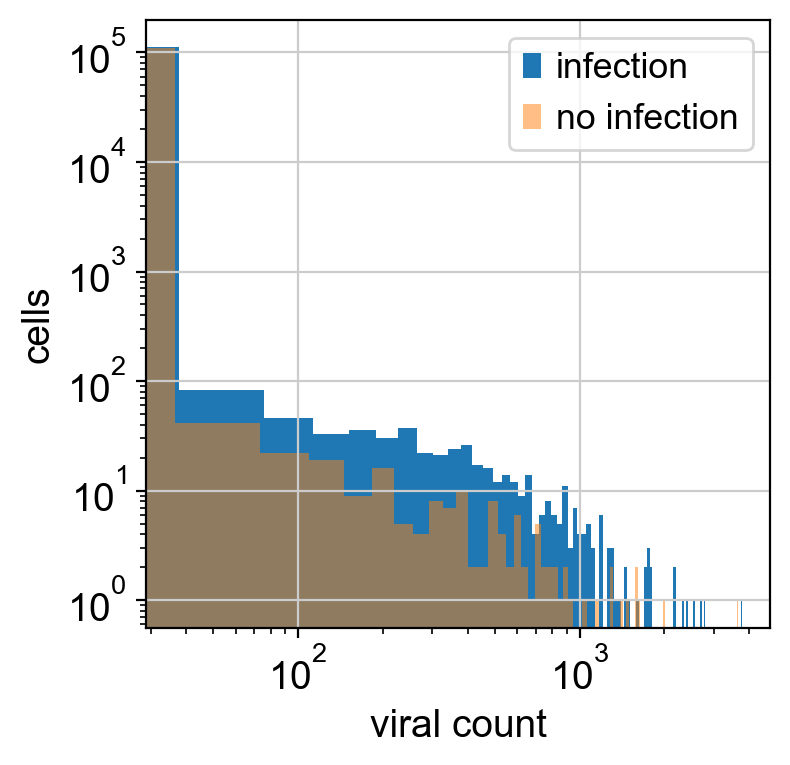

In [10]:
plt.hist(adata[adata.obs.infection_label == 'infected'].obs.viral_counts.values, bins=100, label='infection')
plt.hist(adata[adata.obs.infection_label == 'uninfected'].obs.viral_counts.values, bins=100, alpha=.5, label='no infection')
plt.xlabel('viral count')
plt.ylabel('cells')
plt.xscale('log')
plt.yscale('log')
plt.legend();

## Differential expression plots per cell type

In [5]:
%%time
adatas = {
    f'patient_{p}': sc.read(f'/storage/groups/ml01/workspace/yuge.ji/covid-perturbation/data/210118_annot_patient_{p}.h5ad') for p in [1, 2, 3, 4]
}
# adatas = {
#     f'patient_{p}': adata[adata.obs.patient==f'patient_{p}'] for p in [1, 2, 3, 4]
# }

CPU times: user 42.7 s, sys: 3.83 s, total: 46.5 s
Wall time: 46.7 s


Clean up this fucking data again.

In [6]:
def f(p, adata):
    adata.obs['infection_label'] = ['sars-cov-2' in s if not pd.isnull(s) else 'nan' for s in adata.obs.treatment_virus.values]
    adata.obs['infection_label'] = adata.obs['infection_label'].map({True: 'infected', False: 'uninfected'})
    return adata
adatas = repeat(f)

In [7]:
repeat(lambda p, adata: adata.obs.cell_type.cat.remove_unused_categories(inplace=True))

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


{'patient_1': None, 'patient_2': None, 'patient_3': None, 'patient_4': None}

Standardize perturbation colors:

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'infection_label' as categorical


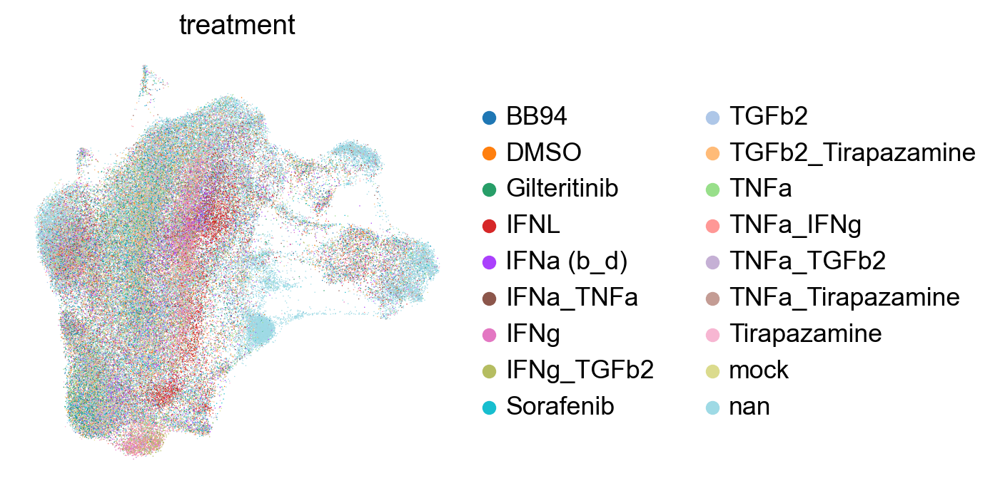

In [8]:
sc.pl.umap(adatas['patient_4'], color='treatment')
pal = dict(zip(adatas['patient_4'].obs.treatment.cat.categories, adatas['patient_4'].uns['treatment_colors']))

def f(p, adata):
    adata.uns['pert_palette'] = pal
    return adata
adatas = repeat(f)

In [19]:
adatas['patient_3'].uns['pert_palette']

{'BB94': '#1f77b4',
 'DMSO': '#ff7f0e',
 'Gilteritinib': '#279e68',
 'IFNL': '#d62728',
 'IFNa (b_d)': '#aa40fc',
 'IFNa_TNFa': '#8c564b',
 'IFNg': '#e377c2',
 'IFNg_TGFb2': '#b5bd61',
 'Sorafenib': '#17becf',
 'TGFb2': '#aec7e8',
 'TGFb2_Tirapazamine': '#ffbb78',
 'TNFa': '#98df8a',
 'TNFa_IFNg': '#ff9896',
 'TNFa_TGFb2': '#c5b0d5',
 'TNFa_Tirapazamine': '#c49c94',
 'Tirapazamine': '#f7b6d2',
 'mock': '#dbdb8d',
 'nan': '#9edae5'}

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


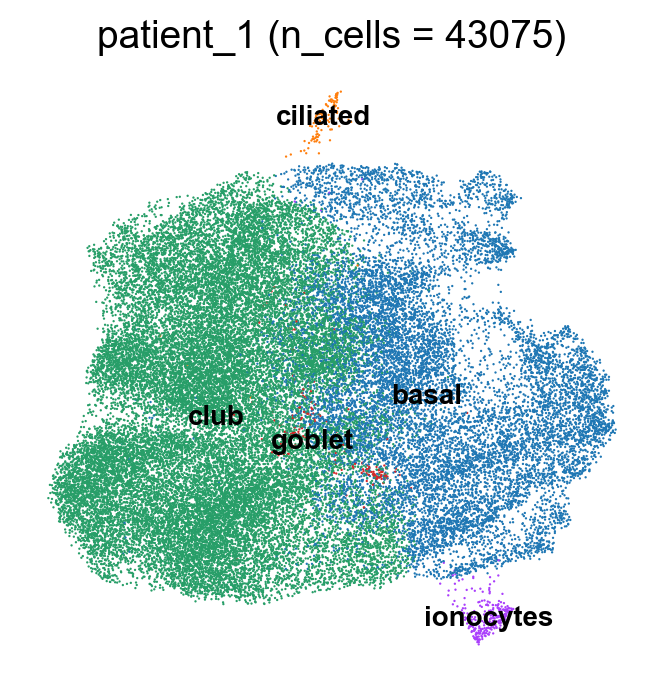

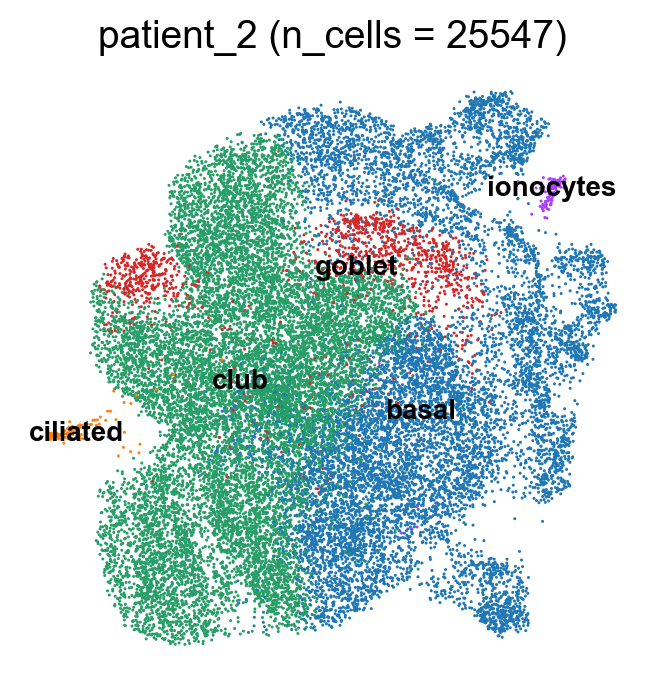

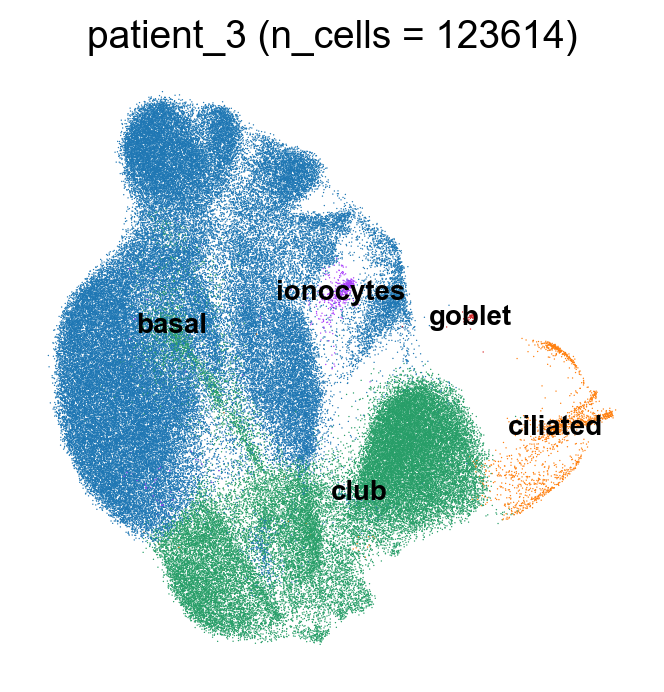

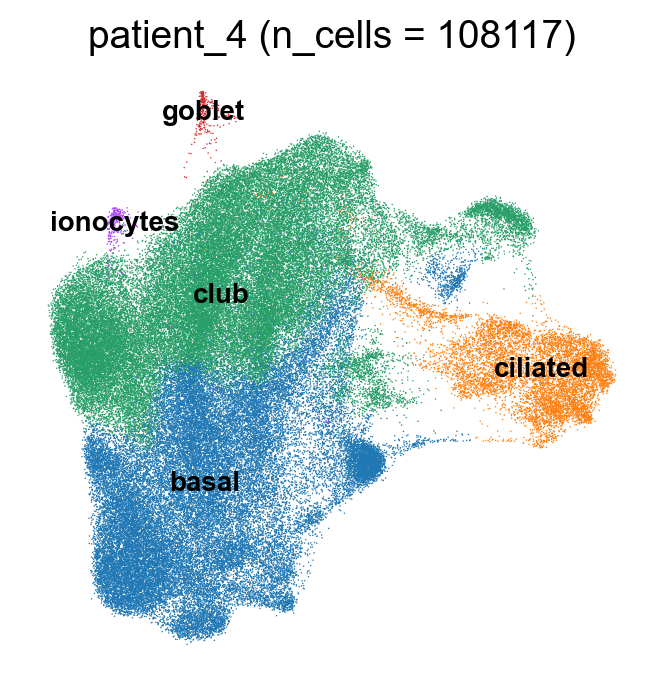

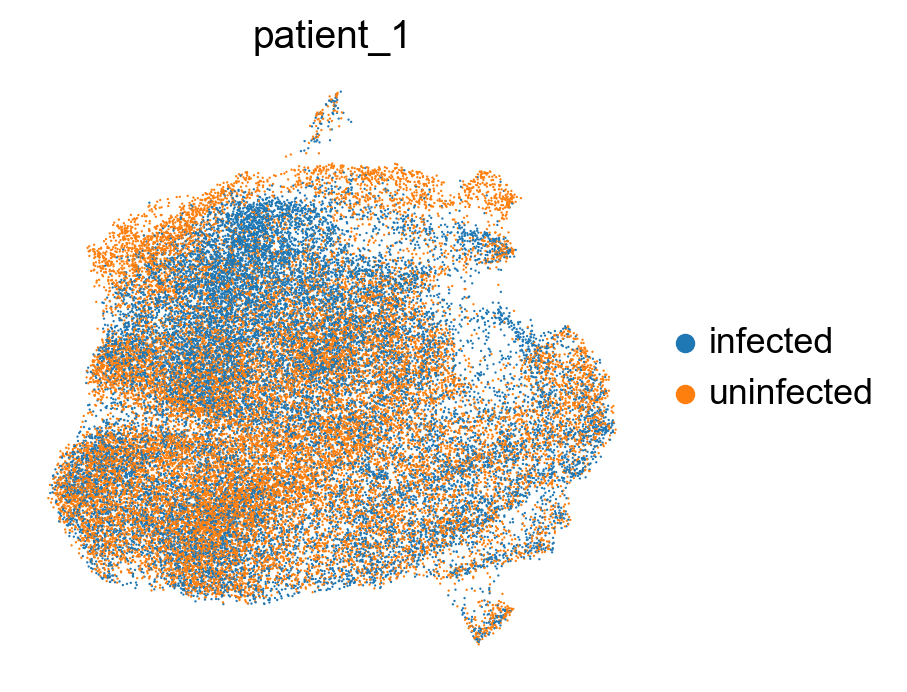

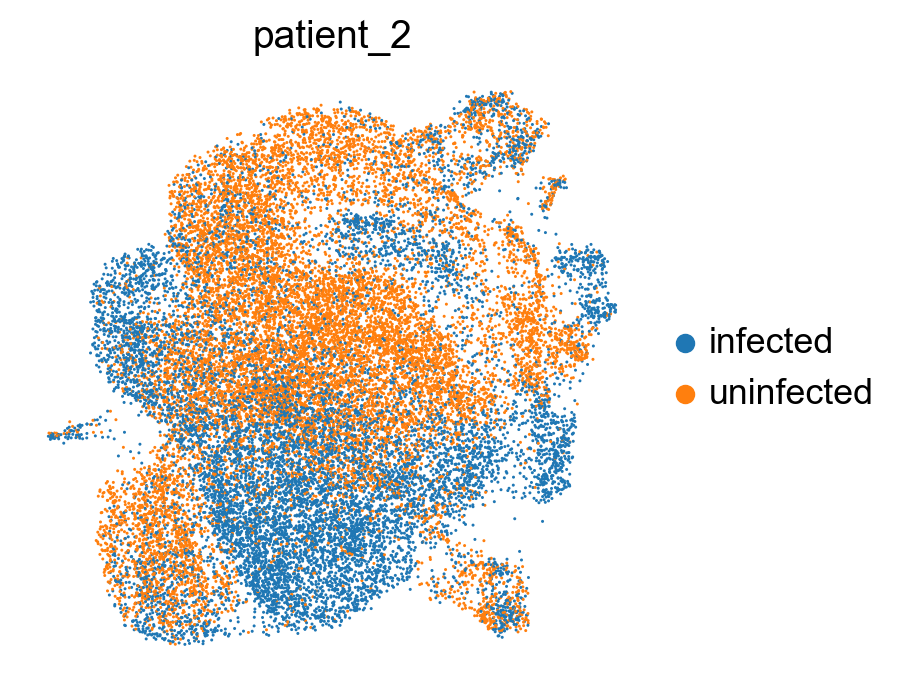

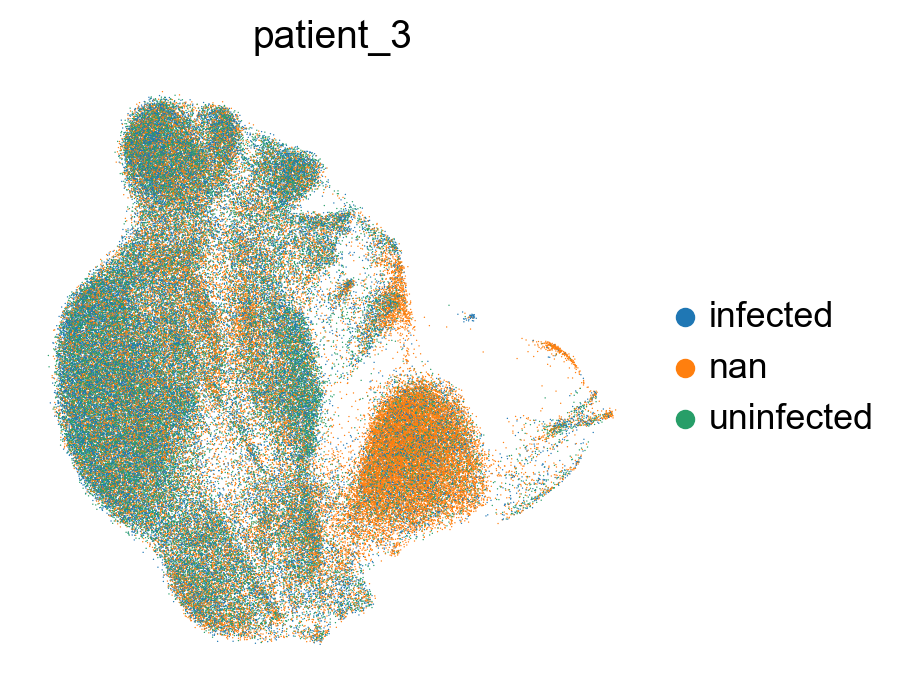

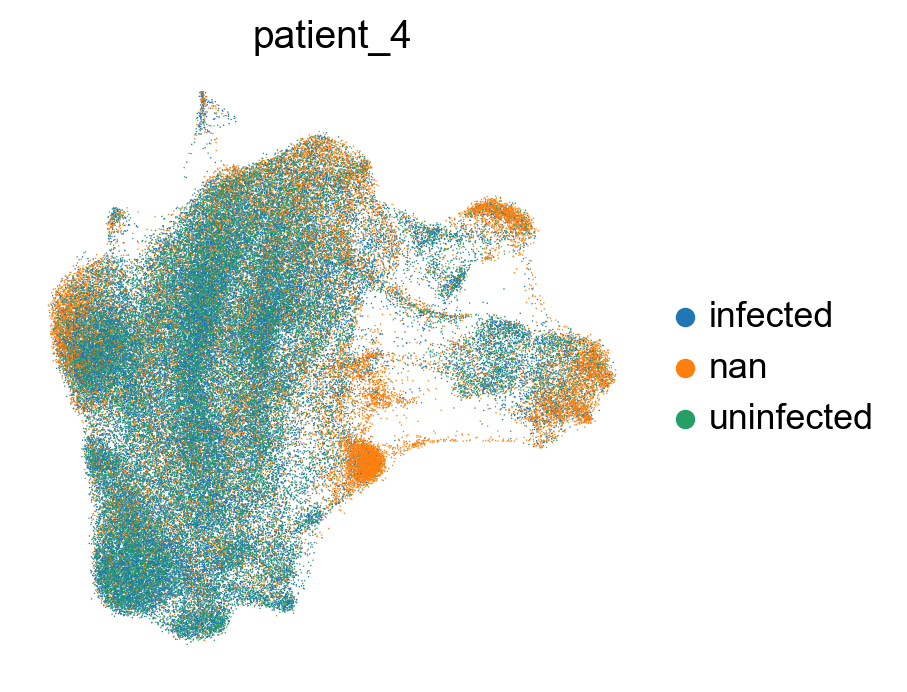

{'patient_1': None, 'patient_2': None, 'patient_3': None, 'patient_4': None}

In [22]:
repeat(lambda p, adata: 
    sc.pl.umap(adata, color='cell_type', title=f'{p} (n_cells = {adata.shape[0]})', legend_loc='on data', legend_fontsize=10)
)
repeat(lambda p, adata: sc.pl.umap(adata, color='infection_label', title=p))

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.


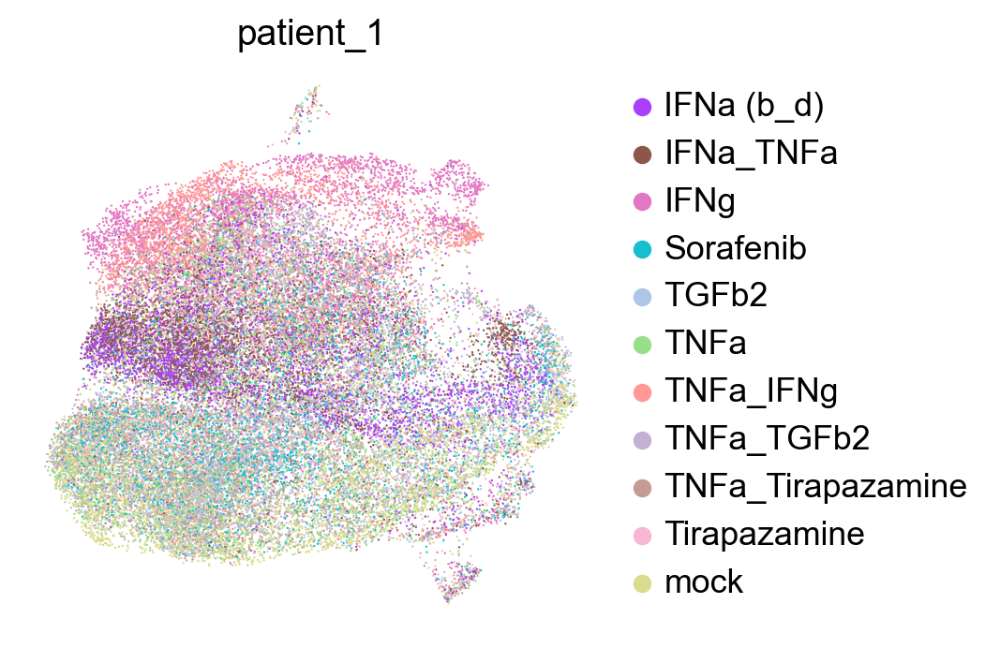

Trying to set attribute `.uns` of view, copying.


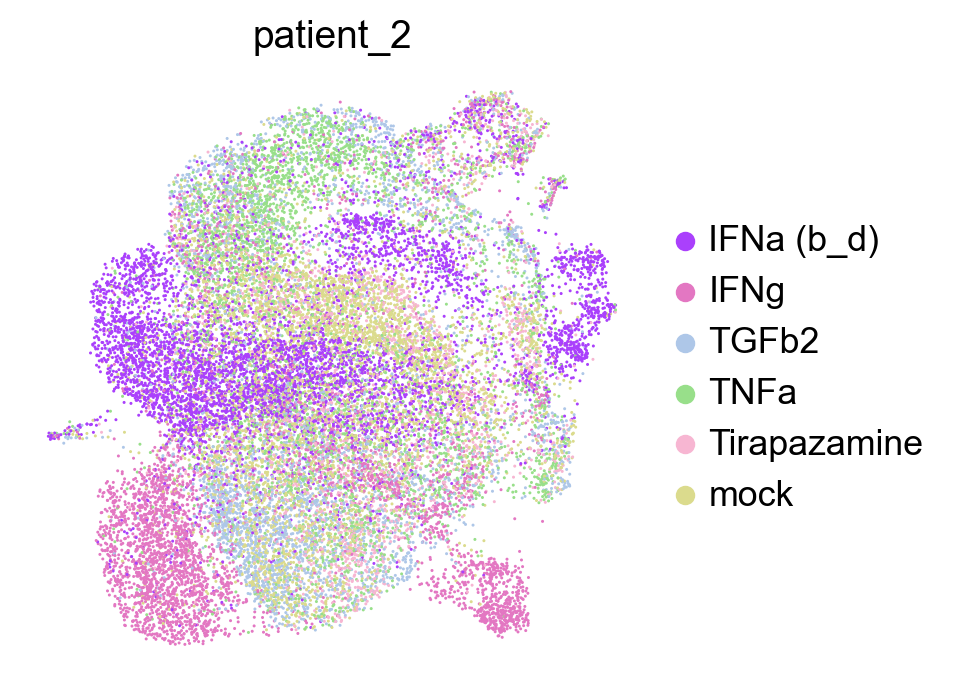

Trying to set attribute `.uns` of view, copying.


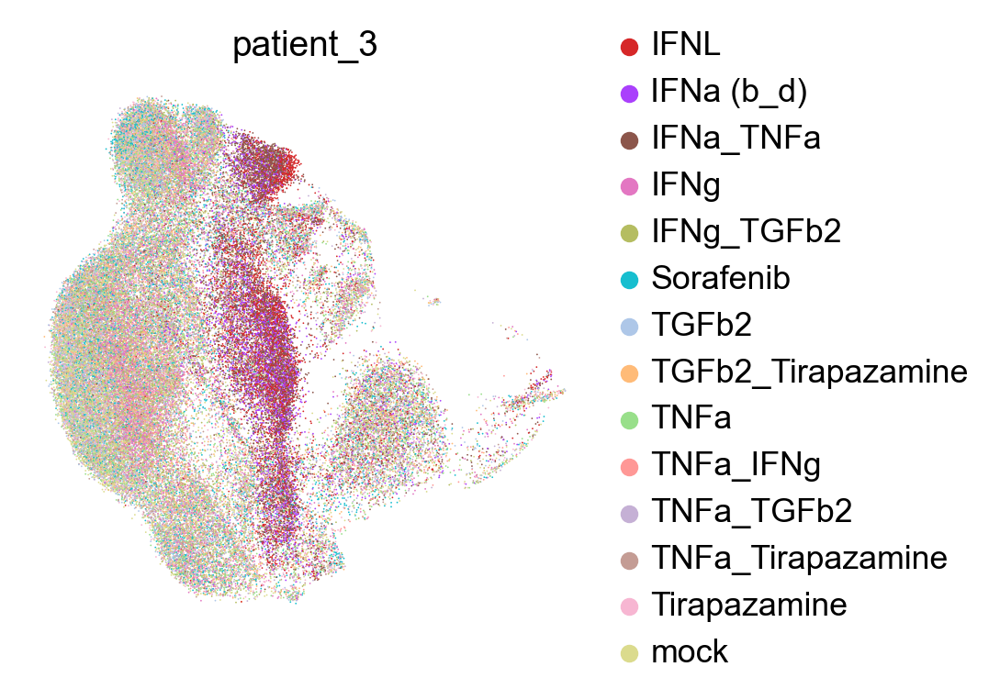

Trying to set attribute `.uns` of view, copying.


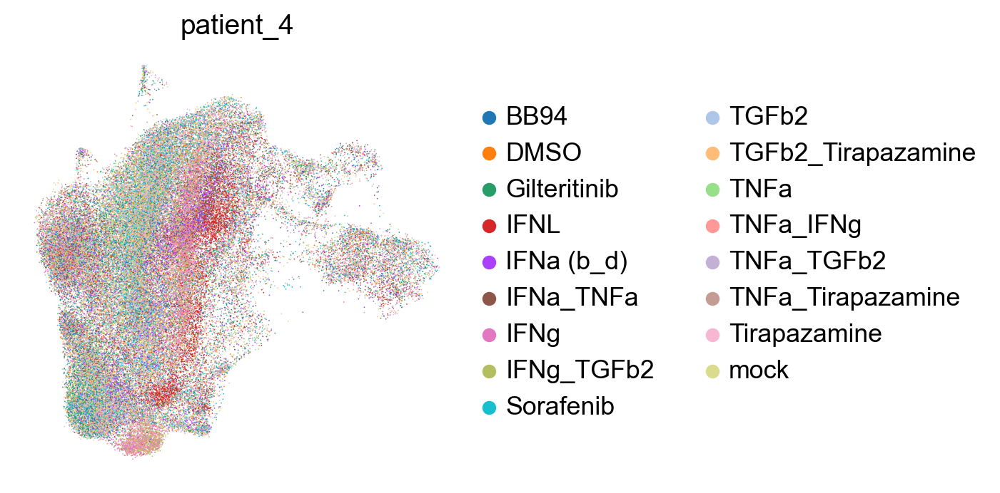

{'patient_1': None, 'patient_2': None, 'patient_3': None, 'patient_4': None}

In [24]:
repeat(lambda p, adata: 
    sc.pl.umap(
        adata[adata.obs.treatment != 'nan'],
        color='treatment', 
        palette=[adata.uns['pert_palette'][trt] for trt in adata[adata.obs.treatment != 'nan'].obs.treatment.cat.categories],
        title=p)
)

Plot together:

In [16]:
import anndata as ad
adata = ad.concat(adatas)

In [ ]:
sc.tl.umap(adata)

#### Perturbation similarity

Plot the concordance between the differential expression signatures.

In [39]:
# adata.obs['treatment_celltype'] = adata.obs.treatment.astype(str) + '_' + adata.obs.cell_type.astype(str)

In [17]:
%%time
summaries = {}
for t in adata.obs.treatment.unique():
    if t == 'nan' or t == 'mock':
        continue
    test_tt = de.test.t_test(
        data=adata[adata.obs.treatment.isin([t, 'mock'])],
        grouping="treatment",
        is_logged=True,
    )
    summaries[t] = test_tt.summary()

CPU times: user 18.1 s, sys: 27.3 s, total: 45.5 s
Wall time: 45.8 s


In [29]:
def plot_correlagram(summaries):
    diffx_summary = summaries[list(summaries.keys())[0]][['gene', 'log2fc']].set_index('gene')  # dummy drug
    diffx_summary.columns = [list(summaries.keys())[0]]

    for t in summaries.keys():
        if 'nan' in t or 'mock' in t:
            continue
        diffx_summary[t] = summaries[t][['gene', 'log2fc']].set_index('gene').log2fc

    diffx_summary = diffx_summary.loc[:,~diffx_summary.columns.duplicated()]

    import seaborn as sns
    sns.clustermap(diffx_summary.corr(), metric='euclidean', cmap='viridis')
    plt.title('Correlation across all genes')
    
    return diffx_summary

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,TNFa_IFNg,IFNa (b_d),IFNg,Tirapazamine,IFNa_TNFa,TNFa,Sorafenib,TNFa_Tirapazamine,TGFb2,TNFa_TGFb2,TGFb2_Tirapazamine,IFNL,IFNg_TGFb2,DMSO,BB94,Gilteritinib
gene,,,,,,,,,,,,,,,,
SAMD11,-0.000289,0.000432,0.000149,0.000422,-0.000018,0.000252,0.000541,0.000290,0.000376,-0.000234,0.000728,0.000616,0.000166,0.000395,-0.000781,0.000234
NOC2L,-0.002433,0.000520,0.007472,-0.001115,-0.000461,-0.001296,-0.000590,-0.005731,0.004177,-0.007736,-0.009385,-0.003493,0.000123,-0.012050,-0.020298,-0.011144
KLHL17,0.000738,-0.001400,0.001863,0.000493,0.001247,-0.001058,0.001784,0.000635,0.000962,0.000461,0.003240,0.004653,0.002840,0.001850,-0.000511,-0.001696


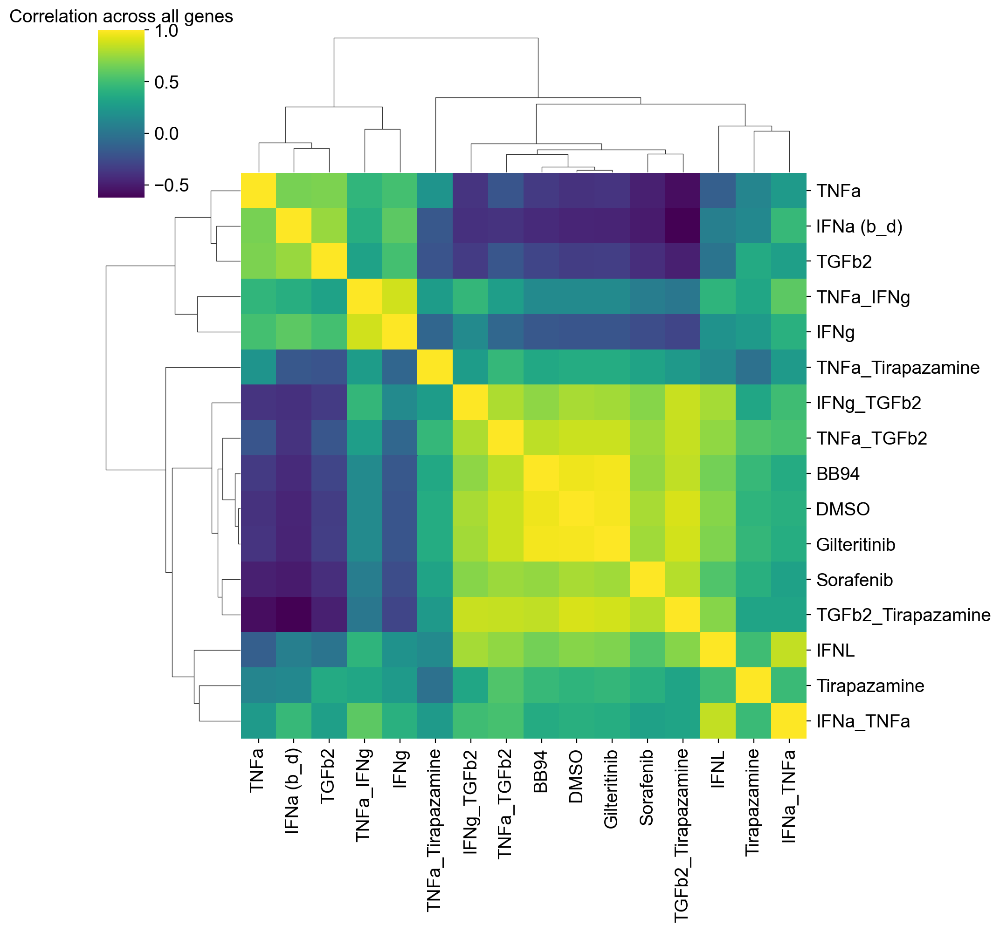

In [21]:
plot_correlagram(summaries).head(3)

No good... do this for all conditions...

In [25]:
%%time
summaries = {}
for ct in adata.obs.cell_type.unique():
    subset = adata[adata.obs.cell_type == ct]
    for t in adata.obs.treatment.unique():
        if t == 'nan' or t == 'mock':
            continue
        test_tt = de.test.t_test(
            data=subset[subset.obs.treatment.isin([t, 'mock'])],
            grouping="treatment",
            is_logged=True,
        )
        summaries[f'{ct}-{t}'] = test_tt.summary()

CPU times: user 21 s, sys: 15.4 s, total: 36.4 s
Wall time: 36.5 s


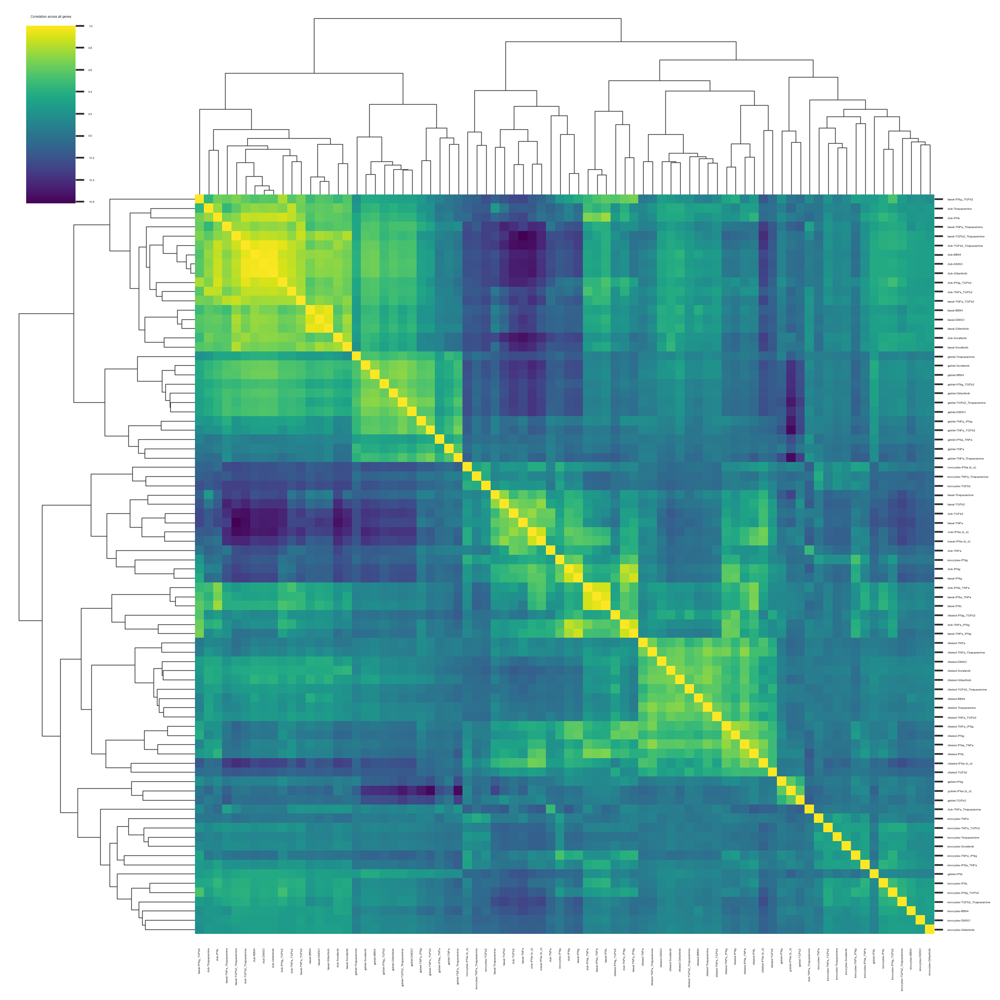

In [30]:
sns.set(font_scale=.3)
diffx_df = plot_correlagram(summaries)

Cluster as an adata:

In [35]:
diffx_adata = ad.AnnData(diffx_df.T)
diffx_adata.obs['cell_type'] = [x.split('-')[0] for x in diffx_adata.obs.index]
diffx_adata.obs['treatment'] = [x.split('-')[1] for x in diffx_adata.obs.index]

sc.tl.pca(diffx_adata)
sc.pp.neighbors(diffx_adata)
sc.tl.umap(diffx_adata)

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


""
club-TNFa_IFNg
club-IFNa (b_d)
club-IFNg
club-Tirapazamine
club-IFNa_TNFa
...
goblet-IFNL
goblet-IFNg_TGFb2
goblet-DMSO
goblet-BB94


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

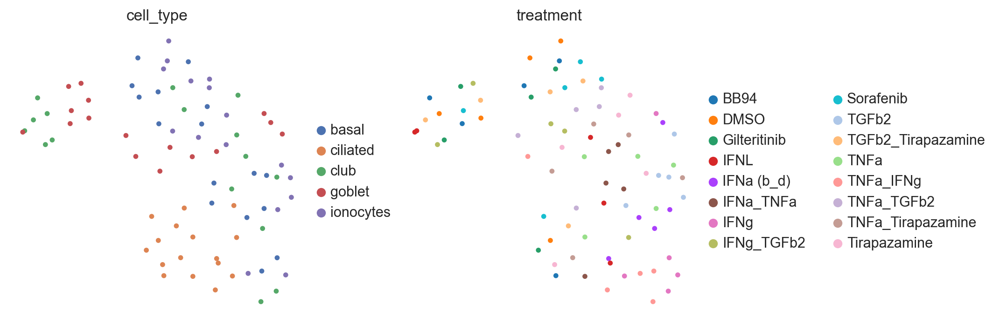

In [42]:
sns.set(font_scale=1)
sc.pl.umap(diffx_adata, color=['cell_type', 'treatment'], size=60)

In [39]:
from sklearn.linear_model import LogisticRegression

/home/icb/yuge.ji/miniconda3/envs/r_env/lib/python3.9/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
%%time
clf = LogisticRegression()
subsamp = sc.pp.subsample(adata[~adata.obs.treatment.isna()], .4, copy=True)
clf.fit(subsamp[:, adatas['patient_4'].var.highly_variable], subsamp.obs.treatment.values)

/home/icb/yuge.ji/miniconda3/envs/r_env/lib/python3.9/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
clf.coef_

In [ ]:
clf.classes_

In [ ]:
ad.anndata(clf.coef_, var=adata.var_names, obs=clf.classes_)

In [ ]:
ad.

#### Heatmaps

In [9]:
import diffxpy.api as de

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/patsy/constraint.py:13: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import Mapping


Using rank_genes_groups.

In [22]:
from gprofiler import GProfiler
def enrich(query):
    gp = GProfiler(return_dataframe=True, user_agent='g:GOSt')

    return gp.profile(
        organism='hsapiens', sources=['GO:BP'], user_threshold=0.05,
        significance_threshold_method='fdr', 
        background=adatas['patient_1'].var_names.tolist(),
        query=query, 
        no_evidences=False)

In [11]:
# compose dataframe for plotting
def plot_deg_heatmap(degs):
    enr_dfs = {}
    terms = []
    for k, genes in degs.items():
        df = enrich(genes)
        # add the most significant term to final list
        terms += df.sort_values('p_value').iloc[:1,:]['name'].values.tolist()
        # aggregate dfs
        df = df[['name', 'p_value']].set_index('name')
        df['p_value'] = -np.log10(df['p_value'])
        enr_dfs[k] = df

    enrichment = pd.concat(enr_dfs)
    enrichment = enrichment[enrichment.index.get_level_values('name').isin(terms)]  # filter to top terms
    enrichment = enrichment.unstack(level=-1).fillna(0)
    return enrichment.T.reset_index(level=0, drop=True)

In [12]:
patient_dicts = {}
for p, adata in adatas.items():
    dfs = {}
    degs = {}
    for i in [True, False]:
        viral_subset = adata[adata.obs.infected == i].copy()
        for ct in adata.obs.cell_type.unique():
            subset = viral_subset[viral_subset.obs.cell_type == ct]
            
            if subset.shape[0] < 300:  # too few cells - unreliable differential expression
                break
            
            sc.tl.rank_genes_groups(subset, groupby='treatment', reference='mock', use_raw=False)

            # get all enrichment results per cell type
            for group in subset.obs.treatment.unique():
                if group != 'mock':
                    dfs[(i, ct, group)] = sc.get.rank_genes_groups_df(subset, group=group)
                    degs[(i, ct, group)] = \
                        dfs[(i, ct, group)]['names'].values.tolist()[:25] + dfs[(i, ct, group)]['names'].values.tolist()[-25:]
    patient_dicts[f'{p}_dfs'] = dfs
    patient_dicts[f'{p}_degs'] = degs

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Trying to set attribute `.uns` of view, copying.


Trying to set attribute `.uns` of view, copying.


Trying to set attribute `.uns` of view, copying.


Trying to set attribute `.uns` of view, copying.


Trying to set attribute `.uns` of view, copying.


Trying to set attribute `.uns` of view, copying.


Trying to set attribute `.uns` of view, copying.


Trying to set attribute `.uns` of view, copying.


Trying to set attribute `.uns` of view, copying.


Trying to set attribute `.uns` of view, copying.


Trying to set attribute `.uns` of view, copying.


Trying to set attribute `.uns` of view, copying.


Trying to set attribute `.uns` of view, copying.


Trying to set attribute `.uns` of view, copying.


Trying to set attribute `.uns` of view, copying.


Trying to set attribute `.uns` of view, copying.


Trying to set attribute `.uns` of view, copying.


Trying to set attribute `.uns` of view, copying.


Trying to set attribute `.uns` of view, copying.


Trying to set attribute `.uns` of view, copying.


Trying to set attribute `.uns` of view, copying.


In [14]:
sns.set(font_scale=1.0)

Plot for patient 3+4 combined data.

In [92]:
%%time
df = plot_deg_heatmap(patient_dicts['patient_3_degs'])

CPU times: user 4.3 s, sys: 142 ms, total: 4.44 s
Wall time: 2min 59s


<AxesSubplot:xlabel='None-None-None', ylabel='name'>

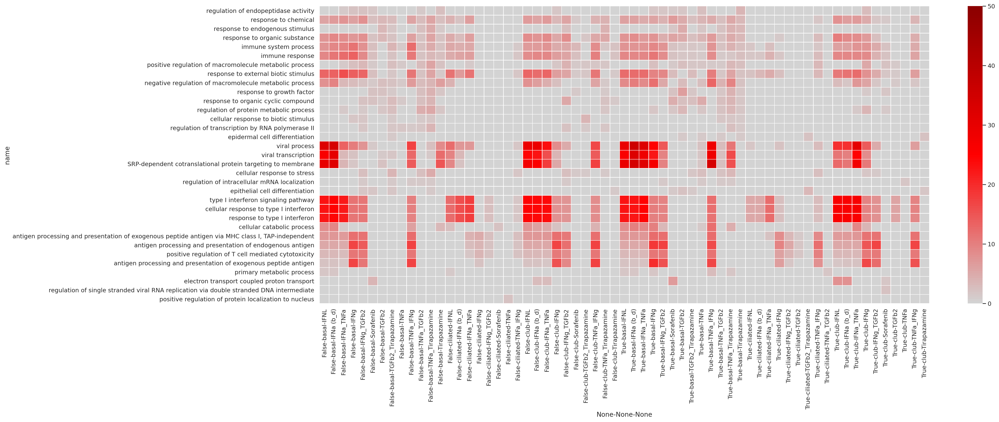

In [94]:
plt.figure(figsize=(25, 10))
sns.heatmap(df, cmap=gray_red, linewidths=.5, vmax=50)

#### Per patient

In [ ]:
## takes a while
for p in ['patient_1', 'patient_2', 'patient_3', 'patient_4']:
    df = plot_deg_heatmap(patient_dict[f'{p}_degs'])
    plt.figure(figsize=(20, 10))
    sns.heatmap(df, cmap=gray_red, linewidths=.5, vmax=50)
    plt.show()

#### Per patient, colored by whether genes went up or down

In [17]:
# compose dataframe for plotting
def plot_deg_heatmap_bi(dfs):
    enr_dfs = {}
    terms = []
    for k, deg_df in dfs.items():
        genes = list(deg_df.names.values[:25]) + list(deg_df.names.values[-25:])
        df = enrich(list(genes))
        # add the most significant term to final list
        terms += df.sort_values('p_value').iloc[:1,:]['name'].values.tolist()
        # aggregate dfs
        df = df[['name', 'p_value']].set_index('name')
        df['p_value'] = -np.log10(df['p_value'])
        enr_dfs[k] = df

    enrichment = pd.concat(enr_dfs)
    enrichment = enrichment[enrichment.index.get_level_values('name').isin(terms)]  # filter to top terms
    return enrichment

In [156]:
%%time
enrichment = plot_deg_heatmap_bi(patient_dicts['patient_3_dfs'])

# plot according to up/down of genes
plot_values = []
for idx in enrichment.index:
    condition_df = dfs[idx[:3]][['scores']]
    plot_values.append(condition_df.head(25).sum().values[0] + condition_df.tail(25).sum().values[0])

# replace p_value with the inverse if it is i 
enrichment['p_value'] = [-v if plot_values[i] < 0 else v for i, v in enumerate(enrichment['p_value'].values)]
enrichment = enrichment.unstack(level=-1).fillna(0)
df = enrichment.T.reset_index(level=0, drop=True)

CPU times: user 8.91 s, sys: 812 ms, total: 9.72 s
Wall time: 4min 2s


<AxesSubplot:xlabel='None-None', ylabel='name'>

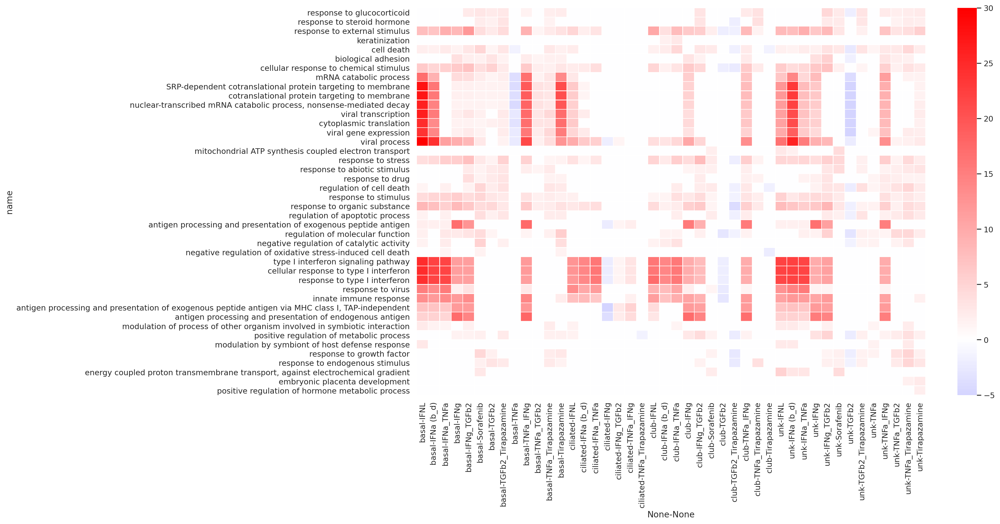

In [165]:
plt.figure(figsize=(16, 10))
sns.heatmap(df[False], cmap='bwr', center=0, linewidths=.5, vmax=30, vmin=-5)

<AxesSubplot:xlabel='None-None', ylabel='name'>

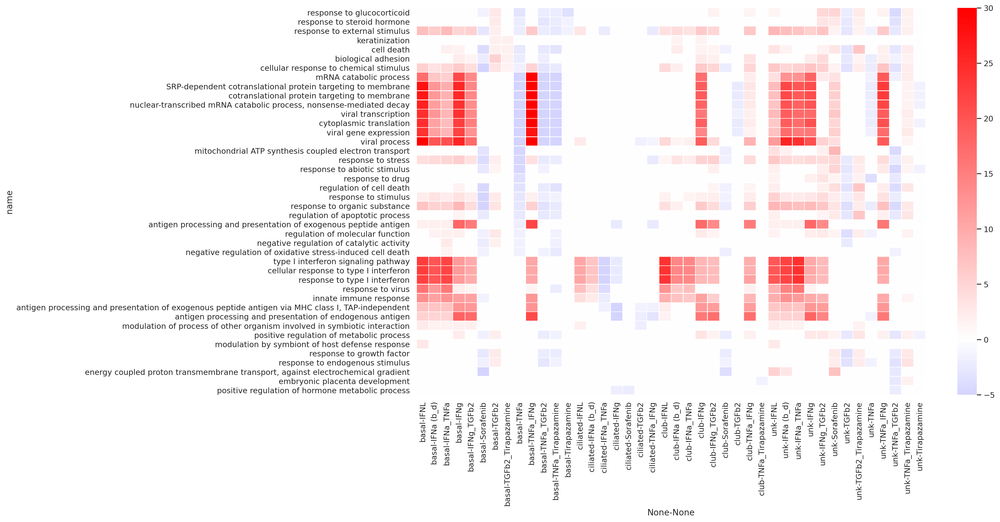

In [166]:
plt.figure(figsize=(16, 10))
sns.heatmap(df[True], cmap='bwr', center=0, linewidths=.5, vmax=30, vmin=-5)

#### infected vs. uninfected

For each condition, calculate the difference in the condition between infected and uninfected.

In [18]:
patient_inf_dicts = {}
for p, adata in adatas.items():
    adata.obs['infected'] = adata.obs['infected'].astype(str)
    inf_degs = {}
    inf_dfs = {}
    for ct in adata.obs.cell_type.unique():
        ct_subset = adata[adata.obs.cell_type == ct]
        for t in adata.obs.treatment.unique():
            if t == 'nan' or t == 'DMSO':  # for some reason DMSO only has infected samples
                continue
            subset = ct_subset[ct_subset.obs.treatment == t]
            if subset.shape[0] < 300:
                continue
            sc.tl.rank_genes_groups(subset, groupby='infected', reference='False')

            inf_dfs[(ct, t)] = sc.get.rank_genes_groups_df(subset, group='True')
            inf_degs[(ct, t)] = list(inf_dfs[(ct, t)].names.values[:25]) + list(inf_dfs[(ct, t)].names.values[-25:])
        
    patient_inf_dicts[f'{p}_dfs'] = inf_dfs
    patient_inf_dicts[f'{p}_degs'] = inf_degs

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/anndata/_core/anndata.py:1210: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Trying to set attribute `.obs` of view, copying.
... storing 'infected' as categorical


Combine terms from all patients.

In [56]:
%%time
dfs = {
    **{('p1', k[0], k[1]): v for k, v in patient_inf_dicts['patient_1_dfs'].items()},
    **{('p2', k[0], k[1]): v for k, v in patient_inf_dicts['patient_2_dfs'].items()},
    **{('p3', k[0], k[1]): v for k, v in patient_inf_dicts['patient_3_dfs'].items()},
    **{('p4', k[0], k[1]): v for k, v in patient_inf_dicts['patient_4_dfs'].items()}
}
enrichment = plot_deg_heatmap_bi(dfs)

CPU times: user 4.57 s, sys: 173 ms, total: 4.74 s
Wall time: 3min 48s


In [80]:
%%time
degs = {
    **{('p1', k[0], k[1]): v for k, v in patient_inf_dicts['patient_1_degs'].items()},
    **{('p2', k[0], k[1]): v for k, v in patient_inf_dicts['patient_2_degs'].items()},
    **{('p3', k[0], k[1]): v for k, v in patient_inf_dicts['patient_3_degs'].items()},
    **{('p4', k[0], k[1]): v for k, v in patient_inf_dicts['patient_4_degs'].items()}
}

# plot according to up/down of overlapping genes
plot_values = []
for idx in enrichment.index:
    overlap = enrich(degs[idx[:3]]).set_index('name').loc[idx[-1]].intersections
    condition_df = dfs[idx[:3]].set_index('names').loc[overlap]
    v = [1 if x > 0 else -1 for x in condition_df.scores.values] # turn to 1/-1
    plot_values.append(np.array(v).sum())

CPU times: user 56.3 s, sys: 1.62 s, total: 57.9 s
Wall time: 39min 42s


In [81]:
# replace p_value with the inverse if there are more downregulated genes
df = enrichment.copy()
df['p_value'] = [-v if plot_values[i] < 0 else v for i, v in enumerate(enrichment['p_value'].values)]
df = df.unstack(level=-1).fillna(0)
df = df.reset_index().drop('level_0', axis=1).groupby(['level_1', 'level_2']).median()
df = df.T.reset_index(level=0, drop=True)

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/pandas/core/generic.py:4153: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


<AxesSubplot:xlabel='level_1-level_2', ylabel='name'>

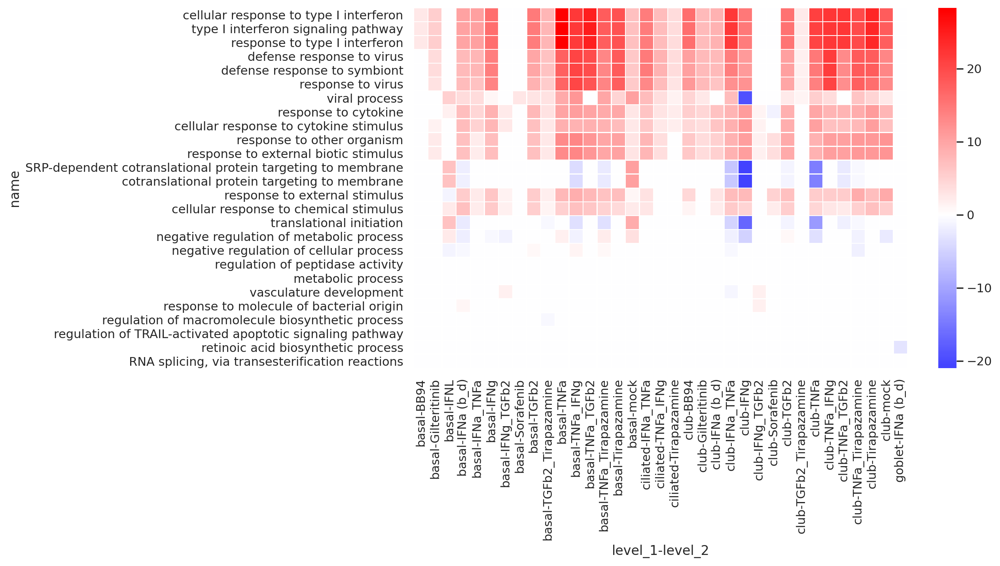

In [84]:
plt.figure(figsize=(10, 6))
sns.heatmap(df, cmap='bwr', center=0, linewidths=.5)#, vmax=30, vmin=-5)

## diffxpy

In [ ]:
for t in adata2.obs.treatment.unique():
    test_tt = de.test.t_test(
        data=adata2[adata2.obs.treatment.isin([t, 'mock'])],
        grouping="treatment",
        is_logged=True,
    )
    test_tt.summary()['gene'].values[:50]
    

In [12]:
plot_deg_heatmap(degs)

,gene,pval,qval,log2fc,mean,zero_mean,zero_variance
0,SAMD11,3.790490e-01,6.238263e-01,-0.000447,0.000616,False,False
1,NOC2L,4.741195e-03,3.390814e-02,-0.015027,0.069608,False,False
2,KLHL17,9.122405e-01,9.596778e-01,0.000283,0.013245,False,False
3,PLEKHN1,1.708339e-09,5.266646e-08,-0.031212,0.067945,False,False
4,PERM1,1.796075e-01,4.372093e-01,-0.001870,0.005223,False,False
...,...,...,...,...,...,...,...
18110,ORF7a-minus,3.173105e-01,5.636905e-01,0.000064,0.000012,False,False
18111,ORF7b-minus,NaN,NaN,0.000000,0.000000,True,True
18112,ORF8-minus,3.173105e-01,5.636905e-01,-0.000089,0.000045,False,False
18113,N-minus,9.142188e-01,9.606473e-01,-0.000244,0.004545,False,False


In [13]:
test_tt.summary().sort_values(by='pval')

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,gene,pval,qval,log2fc,mean,zero_mean,zero_variance
17461,RPS4Y1,0.000000e+00,0.000000e+00,-0.560973,0.565706,False,False
5863,HLA-DRB1,2.904212e-229,2.435327e-225,0.643548,1.140255,False,False
4167,SLC34A2,4.065911e-186,2.272980e-182,0.528767,0.733617,False,False
5356,CD74,1.296571e-171,5.436197e-168,0.560878,1.898809,False,False
3843,RARRES1,5.078776e-158,1.703523e-154,0.772034,2.328509,False,False
...,...,...,...,...,...,...,...
18090,AC023491.2,NaN,NaN,0.000000,0.000000,True,True
18107,E-minus,NaN,NaN,0.000000,0.000000,True,True
18108,M-minus,NaN,NaN,0.000000,0.000000,True,True
18109,ORF6-minus,NaN,NaN,0.000000,0.000000,True,True


/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


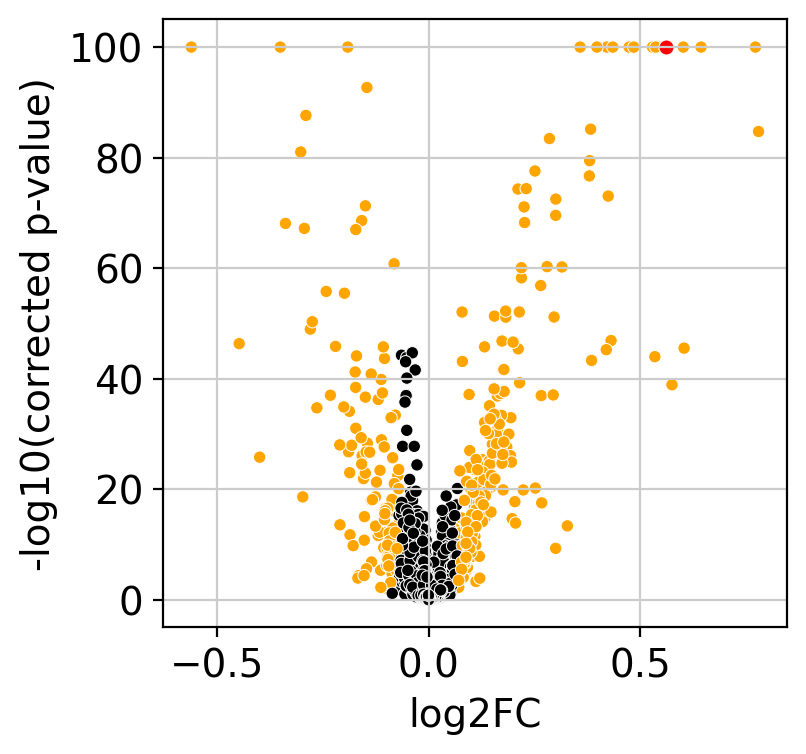

In [14]:
test_tt.plot_volcano(
    corrected_pval=True, min_fc=1.05, alpha=0.05, size=20, log10_p_threshold=-100, log2_fc_threshold=10,
    highlight_ids=['CD74'])

In [ ]:
test_tt.plot_volcano(
    corrected_pval=True, min_fc=1.05, alpha=0.05, size=20, log10_p_threshold=-100, log2_fc_threshold=10,
    highlight_ids=['CD74'])

Previous multi-coeff names...?

In [40]:
%%time
test_tt = de.test.pairwise(
    data=adata1,
    grouping='treatment',
    test='t-test'
)

ValueError: lazy evaluation of pairwise tests only possible if test is z-test

In [ ]:
test_tt = 

## Write to excel tables

### Pseudo-bulk

Per cell type per treatment per infection.

In [85]:
%%time
def f(p, adata):
    data = adata.to_df()
    data['infected'] = adata.obs['infected']
    data['cell_type'] = adata.obs['celltype_coarse']
    data['treatment'] = adata.obs['treatment']
    # write into excel sheet
    data.groupby(['infected', 'cell_type', 'treatment']).mean().T.to_excel(writer, sheet_name=p)

writer = pd.ExcelWriter('bulkified_data.xlsx', engine='xlsxwriter')
datas = repeat(f)
writer.close()

CPU times: user 3min 36s, sys: 32 s, total: 4min 8s
Wall time: 4min 9s


### Differential expression summary

In [84]:
writer = pd.ExcelWriter('diff_expr_data.xlsx', engine='xlsxwriter')
for p in ['patient_1_2', 'patient_3', 'patient_4']:
    diff_dfs = {}
    for k, v in patient_dicts[f'{p}_dfs'].items():
        diff_dfs[k] = v.set_index('names')[['scores']]  # dictionary of dataframes
    
    # write
    pd.concat(diff_dfs).unstack(level=-1).loc[False].T.to_excel(writer, sheet_name=f'{p}_uninfected')
    pd.concat(diff_dfs).unstack(level=-1).loc[True].T.to_excel(writer, sheet_name=f'{p}_infected')
writer.close()

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:1: ResourceWarning: unclosed file <_io.BufferedWriter name='diff_expr_data.xlsx'>
  """Entry point for launching an IPython kernel.
